<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Outlier-problem" data-toc-modified-id="Outlier-problem-1">Outlier problem</a></span></li><li><span><a href="#Classification-problem" data-toc-modified-id="Classification-problem-2">Classification problem</a></span></li><li><span><a href="#Chunking-problem" data-toc-modified-id="Chunking-problem-3">Chunking problem</a></span></li></ul></div>

In [2]:
from hum import Sound, disp_wf
import matplotlib.pyplot as plt
import augly.audio as audaugs
from oscrap.ol import *
import numpy as np
from omodel.ml.event_detector import *

## Outlier problem

In [3]:
basedir = '/Users/owenlloyd/PycharmProjects/oto3/oscrap/ol/synthetic_sounds/data/jazz.00049.wav'

base_wf, sr = audaugs.time_stretch(basedir, rate=0.5)
base_wf, sr = audaugs.pitch_shift(base_wf, n_steps=-10)

clickdir = '/Users/owenlloyd/PycharmProjects/oto3/oscrap/ol/synthetic_sounds/data/hi_click.wav'

click_sample, sr = audaugs.to_mono(clickdir)

In [4]:
outlier_scores, click_chunks, outlier_wf = test_outlier_model(
    base_wf=base_wf,
    sample_rate=44100,
    seconds_between_clicks=3,
    strength_of_click=25,
    click_sample=click_sample,
    chk_size=1024
)

In [5]:
click_chunks

[(0, 12),
 (129, 141),
 (258, 270),
 (387, 399),
 (516, 529),
 (645, 658),
 (775, 787),
 (904, 916),
 (1033, 1045),
 (1162, 1175),
 (1291, 1304),
 (1292, 1304)]

In [6]:
Sound(wf=outlier_wf).hear()

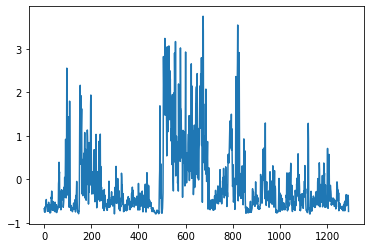

In [7]:
plt.plot(outlier_scores);

In [8]:
outlier_performance(outlier_scores, click_chunks, 2)

(0.8854489164086687,
 0.22727272727272727,
 0.06756756756756757,
 0.10416666666666667)

## Classification problem

In [1]:
seeds = list('abcd') 
scores, annots, wf = test_classification_model(seeds, class_sep = 1)

NameError: name 'test_classification_model' is not defined

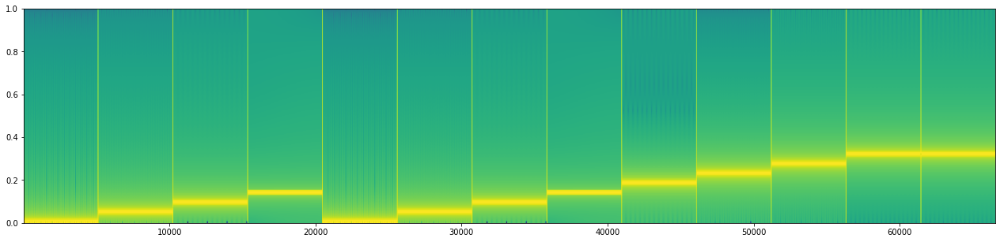

In [39]:
disp_wf(wf)

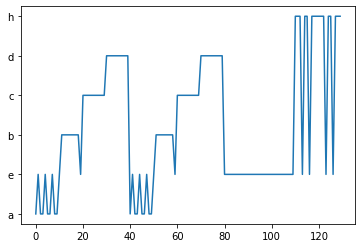

In [40]:
plt.plot(scores);

In [41]:
classification_performance(scores, annots)

/Users/owenlloyd/opt/anaconda3/envs/oto3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


(0.7384615384615385,
 0.7384615384615385,
 0.7867132867132868,
 0.7363834422657951)

## Chunking problem

In [11]:
basedir = '/Users/owenlloyd/PycharmProjects/oto3/oscrap/ol/synthetic_sounds/data/jazz.00049.wav'

base_wf, sr = audaugs.time_stretch(basedir, rate=0.5)
base_wf, sr = audaugs.pitch_shift(base_wf, n_steps=-10)

In [12]:
times = np.arange(0.1,30,0.5)

In [13]:
click_wf, click_frames = build_click_wf(base_wf, times)

In [14]:
Sound(click_wf).hear()

In [15]:
SPA = SpectraPatternDetection()

In [16]:
SPA.fit(click_wf, times)

In [17]:
gen = SPA.detect(click_wf, timestamps=False)

In [18]:
np.array(list(gen))/44100

array([ 0.1084127 ,  0.60954649,  1.1084127 ,  1.60954649,  2.60954649,
        3.1084127 ,  3.60954649,  4.11068027,  5.60954649,  6.11068027,
        6.60954649,  7.1084127 ,  7.60954649,  8.11068027,  8.60954649,
        9.60954649, 10.1084127 , 10.60954649, 11.1084127 , 11.60954649,
       12.60954649, 13.11068027, 15.60954649, 16.1084127 , 16.60954649,
       17.60954649, 18.1084127 , 18.60954649, 19.60954649, 20.1084127 ,
       20.60954649, 21.1084127 , 21.60954649, 22.1084127 , 22.60954649,
       23.1084127 , 23.60954649, 24.60954649, 25.11068027, 25.60954649,
       26.1084127 , 26.60954649, 27.11068027, 27.60954649, 28.1084127 ,
       28.60954649, 29.1084127 , 29.60954649])

In [3]:
basedir = '/Users/owenlloyd/PycharmProjects/oto3/oscrap/ol/synthetic_sounds/data/jazz.00049.wav'

base_wf, sr = audaugs.time_stretch(basedir, rate=0.5)
base_wf, sr = audaugs.pitch_shift(base_wf, n_steps=-10)

In [4]:
times = [1,5,13]

In [5]:
model_chks, true_chks = test_chunking_model(base_wf, times)

In [8]:
SPA = train_chunking_model()

In [2]:
SPA.detect()

In [30]:
wf = random_samples(30*44100, 3000)
times = np.arange(0.1, 30, 0.5)
click_wf, _ = build_click_wf(wf, times, strength_of_click=-35)
SPA = SpectraPatternDetection()
SPA.fit(click_wf, times)

In [19]:
from hum import random_samples

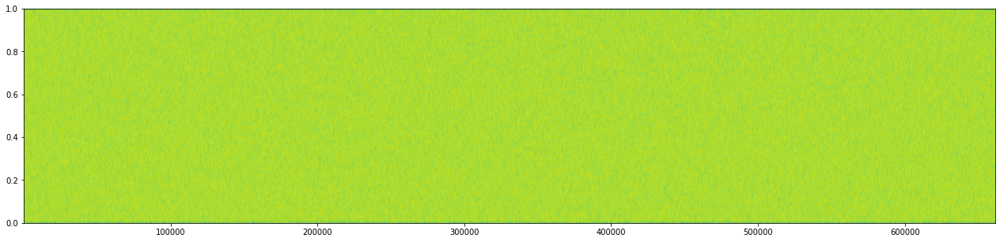

In [23]:
wf = random_samples(30*44100, 3000)